# What is Generic, what is specialized?

We will create a custom nxn matrix that depends on n paramaters, not $n^2$.  What should we be able to inherit from general linear algebra what should be specialized for this custom structure?  Truly good mathematical software thinks carefully about this very question.

In [ ]:
using LinearAlgebra

Let's create a custom nxn matrix that depends on n paramaters, not $n^2$: <br>

C = diag(v) + v*v'

Here M.v will denote the parameters that M depends on. <br>
This is not a sparse matrix, but dense linear algebra clearly does not apply. Good programming is about taking advantage of structure.

In [2]:
v = rand(4)

4-element Array{Float64,1}:
 0.8246424185950523
 0.8032021668051497
 0.1321907010104657
 0.8098508404029892

In [4]:
 Diagonal(v) + v*v'

4×4 Array{Float64,2}:
 1.50468   0.662355  0.10901   0.667837
 0.662355  1.44834   0.106176  0.650474
 0.10901   0.106176  0.149665  0.107055
 0.667837  0.650474  0.107055  1.46571 

# Build a Custom Type

In [ ]:
## This would work, but we'll add a few fancy features
## struct Custom
##     v::Vector
## end

In [5]:
struct Custom{T} <: AbstractMatrix{T}
     v::Vector{T}
end

We added the type parameter {T} and the subtype AbstractMatrix.  The type parameters says that the vector could be made from any type: Int, Float, BigInt, Quaternion,... <br>

The subtype of AbstractMatrix automatically gives some functionality of size and getindex methods are defined as in the next cell.

In [6]:
Base.size(c::Custom)         =   length(c.v), length(c.v)
Base.getindex(c::Custom,i,j) =   c.v[i]*(i==j)  + c.v[i]*c.v[j]

In [9]:
C = Custom([1.0,2,3,4])

4×4 Custom{Float64}:
 2.0  2.0   3.0   4.0
 2.0  6.0   6.0   8.0
 3.0  6.0  12.0  12.0
 4.0  8.0  12.0  20.0

In [10]:
dump(C)

Custom{Float64}
  v: Array{Float64}((4,)) [1.0, 2.0, 3.0, 4.0]


In [12]:
M = Matrix(C)
dump(M)

Array{Float64}((4, 4)) [2.0 2.0 3.0 4.0; 2.0 6.0 6.0 8.0; 3.0 6.0 12.0 12.0; 4.0 8.0 12.0 20.0]


Notice the different types. C would generally store n numbers, M would store $n^2$ numbers.

In [14]:
C * [1,2,3,4] # Matrix times vector automatically works though may not be efficient for large n.

4-element Array{Float64,1}:
  31.0
  64.0
  99.0
 136.0

Why did this automatically work?  The subtyping as an AbstractMatrix and the definition of getindex and size is all that was needed.

In [ ]:
# Matrix times vector with O(n) operations (3n multiplications , 2n additions)
Base.:*(c::Custom, x::Vector) = (c.v) .* x + c.v * (c.v'x)

In [15]:
C * [1,2,3,4] # same answer, now efficient

4-element Array{Float64,1}:
  31.0
  64.0
  99.0
 136.0

# Compute the largest eigenvalue

Having any matrix times vector (efficient or not), is enough to get the largest singular value = largest eigenvalue using the Arnoldi method from Arpack (the Arnoldi package).

In [ ]:
using Pkg
Pkg.add("Arpack")
using Arpack
svds(C,nsv=1)[1].S

We can also use eigmax defined for Symmetric matrices.

In [ ]:
C = Custom([1.0,2.0,3.0])
M = Matrix(C)

In [ ]:
S = Symmetric(M)
eigmax(M)

In [ ]:
svds(C,3)

None of these are efficient on this structure.

# Eigmax Efficiently with Newton

With some linear algebra, we can see that $\det(Diag(v)+vv'-λI)=0$ is equivalent to 
$$ f(\lambda) = 1 + \sum_i \frac{v_i^2}{v_i-λ}=0.$$
The largest root $\lambda$ of the above nonlinear equation is the largest eigenvalue.

In [16]:
f(c::Custom)  = λ ->  1 + sum(c.v[i]^2 / (c.v[i] - λ)   for i=1:length(c.v))
f′(c::Custom) = λ ->      sum(c.v[i]^2 / (c.v[i] - λ)^2 for i=1:length(c.v))

f′ (generic function with 1 method)

In [17]:
function LinearAlgebra.eigmax(c::Custom; tol = eps(2.0), debug = false)
    x0 = maximum(c.v) + maximum(c.v)^2
    δ = f(c)(x0)/f′(c)(x0)
    while abs(δ) > x0 * tol               
        x0 -= δ
        δ = f(c)(x0)/f′(c)(x0) # Newton's Method
        debug && println("x = $x0, δ = $δ") # Debugging
    end
    x0
end

The function $f(λ)$ is concave on $(v_\max,\infty)$ and negative on $(v_\max,\lambda_\max)$.
Thus if we start Newton's method on $(v_\max,\lambda_\max)$, we are guaranteed to converge monotonically to the largest eigenvalue.  It is easy to see that $v_\max + v_\max^2$ is in this interval, so it seems like a good place to start the iteration.

# Compare Timings

In [18]:
v = randn(3000)
C = Custom(v)
M = Matrix(C)
S = Symmetric(M);

In [20]:
@time eigmax(S) # Special Symmetric eigenmax

  1.358957 seconds (19 allocations: 69.718 MiB, 0.82% gc time)


2942.4778236833035

In [22]:
@time maximum(eigvals(M)) # Vanilla LAPACK solver just a bit slower

  1.602959 seconds (20 allocations: 69.741 MiB, 0.68% gc time)


2942.4778236833026

In [24]:
@time eigmax(C) # run twice, no comparison

  0.000516 seconds (66 allocations: 2.063 KiB)


2942.4778236833113

# A Closer Look at Newton

In [ ]:
eigmax(C, debug=true)

In [25]:
using Plots
pyplot()

┌ Info: Recompiling stale cache file /Users/alanedelman/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


┌ Info: Recompiling stale cache file /Users/alanedelman/.julia/compiled/v1.0/PyPlot/oatAj.ji for PyPlot [d330b81b-6aea-500a-939a-2ce795aea3ee]
└ @ Base loading.jl:1184


ArgumentError: ArgumentError: Package LaTeXStrings not found in current path:
- Run `Pkg.add("LaTeXStrings")` to install the LaTeXStrings package.


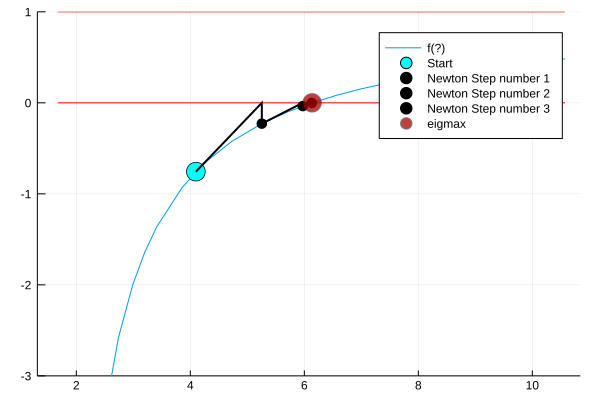

In [31]:
n=5
v = randn(n)
C = Custom(v)

xmin = maximum(v)
xmax = 2*eigmax(C) - xmin

plot(f(C),xmin,xmax, ylim=(-3,1), label="f(λ)")
plot!(x->0,xmin,xmax,color=:red, label="")
plot!(x->1,xmin,xmax, color=:red, label="")


x = xmin + xmin^2 
scatter!([x],[f(C)(x)],color=:cyan, label="Start", markersize=10)
for k=1:3
    xold = x
    x -= f(C)(x)/f′(C)(x) 
    plot!([xold,  x, x],[f(C)(xold), 0, f(C)(x)],width=2,color=:black,label="")
    scatter!([x],[f(C)(x)],color=:black,markersize=5,label="Newton Step number $k")
end
scatter!([eigmax(C)],[0.0],color=:red,markersize=10,label="eigmax",alpha=.5)